In [1]:
# Importing required libraries
import pandas as pd 
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SelectKBest,f_classif
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier,DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error , mean_absolute_error
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold,cross_val_score
from sklearn.preprocessing import LabelEncoder,OrdinalEncoder
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score,classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Traning data
df_train = pd.read_csv("E:\\Project-Housing--2-\\Project-Housing_splitted\\train.csv")
# Testing data
df_test = pd.read_csv("E:\\Project-Housing--2-\\Project-Housing_splitted\\test.csv")

In [3]:
#Display maximum rows and columns from the dataset
pd.set_option('display.max_columns',None)
pd.set_option('display.max_row',None)

In [4]:
df_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,Gas

In [5]:
df_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,337.0,20.0,RL,86.0,14157.0,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9.0,5.0,2005.0,2006.0,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249.0,Unf,0.0,673.0,1922.0,GasA,Ex,Y,SBrkr,1922.0,0.0,0.0,1922.0,1.0,0.0,2.0,0.0,3.0,1.0,Gd,8.0,Typ,1.0,Gd,Attchd,2005.0,Fin,3.0,676.0,TA,TA,Y,178.0,51.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,7.0,2007.0,WD,Normal,128000
1,1018.0,120.0,RL,NaN,5814.0,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8.0,5.0,1984.0,1984.0,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036.0,Unf,0.0,184.0,1220.0,GasA,Gd,Y,SBrkr,1360.0,0.0,0.0,1360.0,1.0,0.0,1.0,0.0,1.0,1.0,Gd,4.0,Typ,1.0,Ex,Attchd,1984.0,RFn,2.0,565.0,TA,TA,Y,63.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,8.0,2009.0,COD,Abnorml,268000
2,929.0,20.0,RL,NaN,11838.0,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8.0,5.0,2001.0,2001.0,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0.0,Unf,0.0,1753.0,1753.0,GasA,Ex,Y,SBrkr,1788.0,0.0,0.0,1788.0,0.0,0.0,2.0,0.0,3.0,1.0,Ex,7.0,Typ,1.0,TA,Attchd,2001.0,RFn,2.0,522.0,TA,TA,Y,202.0,151.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,6.0,2009.0,WD,Normal,269790
3,1148.0,70.0,RL,75.0,12000.0,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7.0,7.0,1941.0,1950.0,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275.0,Unf,0.0,429.0,704.0,GasA,Ex,Y,SBrkr,860.0,704.0,0.0,1564.0,0.0,0.0,1.0,1.0,3.0,1.0,Fa,7.0,Typ,1.0,Gd,Attchd,1941.0,Unf,1.0,234.0,TA,TA,Y,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,7.0,2009.0,WD,Normal,190000
4,1227.0,60.0,RL,86.0,14598.0,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6.0,5.0,2007.0,2007.0,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0.0,Unf,0.0,894.0,894.0,GasA,Ex,Y,SBrkr,894.0,1039.0,0.0,1933.0,0.0,0.0,2.0,1.0,4.0,1.0,Gd,9.0,Typ,1.0,Gd,BuiltIn,2007.0,Fin,3.0,668.0,TA,TA,Y,100.0,18.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,1.0,2008.0,WD,Normal,215000
5,650.0,180.0,RM,21.0,1936.0,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4.0,6.0,1970.0,1970.0,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131.0,GLQ,499.0,0.0,630.0,GasA,Gd,Y,SBrkr,630.0,0.0,0.0,630.0,1.0,0.0,1.0,0.0,1.0,1.0,TA,3.0,Typ,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,Y,0.0,0.0,0.0,0.0,0.0,0.0,NaN,MnPrv,NaN,0.0,12.0,2007.0,WD,Normal,219210
6,1453.0,180.0,RM,35.0,3675.0,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5.0,5.0,2005.0,2005.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547.0,Unf,0.0,0.0,547.0,GasA,Gd,Y,SBrkr,1072.0,0.0,0.0,1072.0,1.0,0.0,1.0,0.0,2.0,1.0,TA,5.0,Typ,0.0,NaN,Basment,2005.0,Fin,2.0,525.0,TA,TA,Y,0.0,28.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,5.0,2006.0,WD,Normal,121500
7,152.0,20.0,RL,107.0,13891.0,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8.0,5.0,2007.0,2008.0,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400.0,Unf,0.0,310.0,1710.0,GasA,Ex,Y,SBrkr,1710.0,0.0,0.0,1710.0,1.0,0.0,2.0,0.0,2.0,1.0,Gd,6.0,Typ,1.0,Gd,Attchd,2007.0,RFn,3.0,866.0,TA,TA,Y,0.0,102.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,1.0,2008.0,New

In [6]:
df_train.shape

(1168, 81)

In [7]:
df_test.shape

(1168, 81)

In [8]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [9]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    float64
 1   MSSubClass     292 non-null    float64
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    float64
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    float64
 18  OverallC

In [10]:
df_train.describe(include = 'all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1168.000000,1168.000000,1168,954.00000,1168.000000,1168,77,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168,1168.000000,1168.000000,1168.000000,1168.000000,1168,1168,1168,1168,1161,1161.000000,1168,1168,1168,1138,1138,1137,1138,1168.000000,1137,1168.000000,1168.000000,1168.000000,1168,1168,1168,1168,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168,1168.000000,1168,1168.000000,617,1104,1104.000000,1104,1168.000000,1168.000000,1104,1104,1168,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,7,237,44,1168.000000,1168.000000,1168.000000,1168,1168,1168.000000
unique,NaN,NaN,5,NaN,NaN,2,2,4,4,1,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,14,15,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,CBlock,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,NaN,928,NaN,NaN,1164,41,740,1046,1168,842,1105,182,1005,1154,981,578,NaN,NaN,NaN,NaN,915,1144,396,387,696,NaN,717,1022,516,517,1041,756,345,NaN,1002,NaN,NaN,NaN,1143,585,1090,1070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,578,NaN,1085,NaN,301,691,NaN,487,NaN,NaN,1050,1061,1071,NaN,NaN,NaN,NaN,NaN,NaN,3,129,40,NaN,NaN,NaN,999,945,NaN
mean,724.136130,56.767979,NaN,70.98847,10484.749144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.104452,5.595890,1970.930651,1984.758562,NaN,NaN,NaN,NaN,NaN,102.310078,NaN,NaN,NaN,NaN,NaN,NaN,NaN,444.726027,NaN,46.647260,569.721747,1061.095034,NaN,NaN,NaN,NaN,1169.860445,348.826199,6.380137,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,NaN,6.542808,NaN,0.617295,NaN,NaN,1978.193841,NaN,1.776541,476.860445,NaN,NaN,NaN,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,NaN,NaN,NaN,47.315068,6.344178,2007.804795,NaN,NaN,181477.005993
std,416.159877,41.940650,NaN,24.82875,8957.442311,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.390153,1.124343,30.145255,20.785185,NaN,NaN,NaN,NaN,NaN,182.595606,NaN,NaN,NaN,NaN,NaN,NaN,NaN,462.664785,NaN,163.520016,449.375525,442.272249,NaN,NaN,NaN,NaN,391.161983,439.696370,50.892844,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,NaN,1.598484,NaN,0.650575,NaN,NaN,24.890704,NaN,0.745554,214.466769,NaN,NaN,NaN,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,NaN,NaN,NaN,543.264432,2.686352,1.329738,NaN,NaN,79105.586863
min,1.000000,20.000000,NaN,21.00000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1875.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,1900.000000,NaN,0.000000,

In [11]:
df_test.describe(include = 'all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,292.000000,292.000000,292,247.000000,292.000000,292,14,292,292,292,292,292,292,292,292,292,292,292.000000,292.000000,292.000000,292.000000,292,292,292,292,291,291.000000,292,292,292,285,285,285,285,292.000000,285,292.000000,292.000000,292.000000,292,292,292,291,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292,292.000000,292,292.000000,153,275,275.000000,275,292.000000,292.000000,275,275,292,292.000000,292.000000,292.000000,292.000000,292.000000,292.0,0.0,44,10,292.000000,292.000000,292.000000,292,292,1168.000000
unique,NaN,NaN,4,NaN,NaN,2,2,4,4,2,5,3,24,8,2,5,8,NaN,NaN,NaN,NaN,5,3,12,14,4,NaN,4,4,6,4,3,4,6,NaN,6,NaN,NaN,NaN,4,4,2,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,6,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2,NaN,NaN,NaN,6,4,NaN
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,GLQ,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,NaN,223,NaN,NaN,290,9,185,265,291,210,277,43,255,291,239,148,NaN,NaN,NaN,NaN,226,290,119,117,168,NaN,189,260,134,132,270,197,88,NaN,254,NaN,NaN,NaN,285,156,275,264,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,157,NaN,275,NaN,79,179,NaN,118,NaN,NaN,261,265,269,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28,9,NaN,NaN,NaN,268,253,NaN
mean,755.955479,57.414384,NaN,66.425101,10645.143836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.078767,5.493151,1972.616438,1985.294521,NaN,NaN,NaN,NaN,NaN,109.171821,NaN,NaN,NaN,NaN,NaN,NaN,NaN,439.294521,NaN,46.157534,557.315068,1042.767123,NaN,NaN,NaN,NaN,1133.691781,339.657534,3.702055,1477.051370,0.424658,0.065068,1.575342,0.359589,2.794521,1.05137,NaN,6.417808,NaN,0.595890,NaN,NaN,1979.760000,NaN,1.729452,457.458904,NaN,NaN,NaN,86.397260,47.061644,17.708904,2.489726,15.099315,0.0,NaN,NaN,NaN,28.184932,6.232877,2007.859589,NaN,NaN,181477.005993
std,442.565228,43.780649,NaN,21.726343,13330.669795,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.356147,1.063267,30.447016,20.105792,NaN,NaN,NaN,NaN,NaN,175.030021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,429.559675,NaN,152.467119,411.043768,424.561153,NaN,NaN,NaN,NaN,366.941919,424.278825,38.219527,514.199429,0.508831,0.247070,0.547856,0.494795,0.807336,0.23616,NaN,1.728105,NaN,0.621259,NaN,NaN,23.868875,NaN,0.754430,210.785591,NaN,NaN,NaN,121.898836,65.865449,51.892906,30.247488,58.483473,0.0,NaN,NaN,NaN,224.036218,2.774556,1.322867,NaN,NaN,79105.586863
min,6.000000,20.000000,NaN,21.000000,1526.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.000000,3.000000,1872.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,372.000000,0.000000,0.000000,520.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,NaN,3.000000,NaN,0.000000,NaN,NaN,1916.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,NaN,NaN,NaN,0.000000,1.000000,2006.00

In [12]:
z = df_train['LotFrontage'].mean()
df_train['LotFrontage'].fillna(z,inplace = True)

In [13]:
p = df_test['LotFrontage'].mean()
df_test['LotFrontage'].fillna(p,inplace = True)

In [14]:
df_train.isna().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage         0
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [15]:
df_test.isna().sum()

Id                876
MSSubClass        876
MSZoning          876
LotFrontage         0
LotArea           876
Street            876
Alley            1154
LotShape          876
LandContour       876
Utilities         876
LotConfig         876
LandSlope         876
Neighborhood      876
Condition1        876
Condition2        876
BldgType          876
HouseStyle        876
OverallQual       876
OverallCond       876
YearBuilt         876
YearRemodAdd      876
RoofStyle         876
RoofMatl          876
Exterior1st       876
Exterior2nd       876
MasVnrType        877
MasVnrArea        877
ExterQual         876
ExterCond         876
Foundation        876
BsmtQual          883
BsmtCond          883
BsmtExposure      883
BsmtFinType1      883
BsmtFinSF1        876
BsmtFinType2      883
BsmtFinSF2        876
BsmtUnfSF         876
TotalBsmtSF       876
Heating           876
HeatingQC         876
CentralAir        876
Electrical        877
1stFlrSF          876
2ndFlrSF          876
LowQualFin

In [16]:
df_train = df_train.drop(columns = ['MiscFeature','PoolQC','Fence','Alley'])
df_test = df_test.drop(columns = ['MiscFeature','PoolQC','Fence','Alley'])

In [17]:
df_train['LotFrontage'].value_counts()

70.98847     214
60.00000     111
80.00000      60
70.00000      58
75.00000      46
50.00000      44
65.00000      35
85.00000      26
90.00000      20
78.00000      19
68.00000      16
24.00000      16
73.00000      16
64.00000      14
79.00000      14
21.00000      14
55.00000      13
51.00000      13
72.00000      13
59.00000      12
100.00000     12
82.00000      12
71.00000      11
74.00000      11
63.00000      11
69.00000      10
53.00000      10
88.00000      10
66.00000      10
67.00000       9
34.00000       9
84.00000       9
40.00000       8
92.00000       8
43.00000       8
77.00000       8
76.00000       8
52.00000       8
61.00000       7
86.00000       7
95.00000       7
62.00000       7
35.00000       7
57.00000       7
96.00000       6
94.00000       6
120.00000      6
44.00000       6
54.00000       6
81.00000       6
41.00000       6
98.00000       6
89.00000       5
30.00000       5
105.00000      5
36.00000       5
93.00000       5
58.00000       5
87.00000      

In [18]:
df_train['MasVnrType'].value_counts()

None       696
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64

In [19]:
df_train['MasVnrArea'].value_counts()

0.0       692
72.0        7
120.0       6
180.0       6
106.0       5
84.0        5
108.0       5
80.0        5
320.0       4
40.0        4
132.0       4
360.0       4
300.0       4
336.0       4
340.0       4
178.0       4
168.0       4
220.0       4
210.0       4
246.0       4
160.0       4
288.0       4
100.0       4
216.0       4
16.0        4
350.0       3
256.0       3
170.0       3
104.0       3
99.0        3
130.0       3
186.0       3
128.0       3
252.0       3
174.0       3
200.0       3
110.0       3
456.0       3
183.0       3
85.0        3
82.0        3
70.0        3
208.0       3
182.0       2
45.0        2
166.0       2
424.0       2
420.0       2
164.0       2
212.0       2
272.0       2
268.0       2
169.0       2
344.0       2
245.0       2
189.0       2
203.0       2
206.0       2
144.0       2
240.0       2
18.0        2
145.0       2
243.0       2
113.0       2
90.0        2
306.0       2
140.0       2
362.0       2
157.0       2
125.0       2
117.0       2
50.0  

In [20]:
df_train['BsmtQual'].value_counts()

TA    517
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64

In [21]:
df_train['BsmtCond'].value_counts()

TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64

In [22]:
df_train['BsmtExposure'].value_counts()

No    756
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64

In [23]:
df_train['BsmtFinType1'].value_counts()

Unf    345
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64

In [24]:
df_train['BsmtFinType2'].value_counts()

Unf    1002
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64

In [25]:
df_train['FireplaceQu'].value_counts()

Gd    301
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64

In [26]:
df_train['GarageType'].value_counts()

Attchd     691
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64

In [27]:
df_train['GarageYrBlt'].value_counts()

2006.0    52
2005.0    51
2007.0    40
2003.0    37
2004.0    36
1998.0    25
1977.0    24
1999.0    23
2002.0    23
2008.0    21
1993.0    20
1976.0    20
1957.0    18
2009.0    18
2001.0    18
2000.0    18
1968.0    18
1962.0    18
1950.0    18
1966.0    18
1997.0    17
1958.0    17
1965.0    17
1974.0    17
1995.0    17
1960.0    16
1994.0    15
1978.0    14
1970.0    14
1969.0    14
1990.0    14
1959.0    14
1954.0    14
1961.0    13
1996.0    13
1964.0    13
1963.0    13
1956.0    13
1980.0    12
1955.0    12
1971.0    12
1920.0    12
1988.0    12
1940.0    12
1979.0    11
1973.0    10
1967.0    10
1992.0    10
1981.0    10
1953.0     9
1972.0     9
1948.0     9
1985.0     9
1975.0     8
1989.0     8
1987.0     8
1925.0     7
1941.0     7
1983.0     7
1949.0     7
1991.0     7
1986.0     6
1930.0     6
1939.0     6
1951.0     5
1936.0     5
1946.0     4
1935.0     4
1926.0     4
1916.0     4
1984.0     4
1945.0     4
1982.0     3
1952.0     3
1931.0     3
1923.0     3
1910.0     3

In [28]:
df_train['GarageFinish'].value_counts()

Unf    487
RFn    339
Fin    278
Name: GarageFinish, dtype: int64

In [29]:
df_train['BsmtCond'].value_counts()

TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64

In [30]:
df_train['GarageQual'].value_counts()

TA    1050
Fa      39
Gd      11
Ex       2
Po       2
Name: GarageQual, dtype: int64

In [31]:
df_train['GarageCond'].value_counts()

TA    1061
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64

In [32]:
df_train['MasVnrType'] = df_train['MasVnrType'].fillna(df_train['MasVnrType'].mode().iloc[0])
df_train['BsmtQual'] = df_train['BsmtQual'].fillna(df_train['BsmtQual'].mode().iloc[0])
df_train['BsmtExposure'] = df_train['BsmtExposure'].fillna(df_train['BsmtExposure'].mode().iloc[0])
df_train['BsmtCond'] = df_train['BsmtCond'].fillna(df_train['BsmtCond'].mode().iloc[0])
df_train['BsmtFinType1'] = df_train['BsmtFinType1'].fillna(df_train['BsmtFinType1'].mode().iloc[0])
df_train['BsmtFinType2'] = df_train['BsmtFinType2'].fillna(df_train['BsmtFinType2'].mode().iloc[0])
df_train['FireplaceQu'] = df_train['FireplaceQu'].fillna(df_train['FireplaceQu'].mode().iloc[0])
df_train['GarageType'] = df_train['GarageType'].fillna(df_train['GarageType'].mode().iloc[0])
df_train['GarageFinish'] = df_train['GarageFinish'].fillna(df_train['GarageFinish'].mode().iloc[0])
df_train['GarageQual'] = df_train['GarageQual'].fillna(df_train['GarageQual'].mode().iloc[0])
df_train['GarageCond'] = df_train['GarageCond'].fillna(df_train['GarageCond'].mode().iloc[0])
df_train['LotFrontage'] = df_train['LotFrontage'].fillna(df_train['LotFrontage'].mean())
df_train['MasVnrArea'] = df_train['MasVnrArea'].fillna(df_train['MasVnrArea'].mean())
df_train['GarageYrBlt'] = df_train['GarageYrBlt'].fillna(df_train['GarageYrBlt'].mean())

In [33]:
df_test['MasVnrType'] = df_test['MasVnrType'].fillna(df_test['MasVnrType'].mode().iloc[0])
df_test['BsmtQual'] = df_test['BsmtQual'].fillna(df_test['BsmtQual'].mode().iloc[0])
df_test['BsmtExposure'] = df_test['BsmtExposure'].fillna(df_test['BsmtExposure'].mode().iloc[0])
df_test['BsmtCond'] = df_test['BsmtCond'].fillna(df_test['BsmtCond'].mode().iloc[0])
df_test['BsmtFinType1'] = df_test['BsmtFinType1'].fillna(df_test['BsmtFinType1'].mode().iloc[0])
df_test['BsmtFinType2'] = df_test['BsmtFinType2'].fillna(df_test['BsmtFinType2'].mode().iloc[0])
df_test['FireplaceQu'] = df_test['FireplaceQu'].fillna(df_test['FireplaceQu'].mode().iloc[0])
df_test['GarageType'] = df_test['GarageType'].fillna(df_test['GarageType'].mode().iloc[0])
df_test['GarageFinish'] = df_test['GarageFinish'].fillna(df_test['GarageFinish'].mode().iloc[0])
df_test['GarageQual'] = df_test['GarageQual'].fillna(df_test['GarageQual'].mode().iloc[0])
df_test['GarageCond'] = df_test['GarageCond'].fillna(df_test['GarageCond'].mode().iloc[0])
df_test['LotFrontage'] = df_test['LotFrontage'].fillna(df_test['LotFrontage'].mean())
df_test['MasVnrArea'] = df_test['MasVnrArea'].fillna(df_test['MasVnrArea'].mean())
df_test['GarageYrBlt'] = df_test['GarageYrBlt'].fillna(df_test['GarageYrBlt'].mean())

In [34]:
df_train.isna().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

In [35]:
df_test.isna().sum()

Id               876
MSSubClass       876
MSZoning         876
LotFrontage        0
LotArea          876
Street           876
LotShape         876
LandContour      876
Utilities        876
LotConfig        876
LandSlope        876
Neighborhood     876
Condition1       876
Condition2       876
BldgType         876
HouseStyle       876
OverallQual      876
OverallCond      876
YearBuilt        876
YearRemodAdd     876
RoofStyle        876
RoofMatl         876
Exterior1st      876
Exterior2nd      876
MasVnrType         0
MasVnrArea         0
ExterQual        876
ExterCond        876
Foundation       876
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1       876
BsmtFinType2       0
BsmtFinSF2       876
BsmtUnfSF        876
TotalBsmtSF      876
Heating          876
HeatingQC        876
CentralAir       876
Electrical       877
1stFlrSF         876
2ndFlrSF         876
LowQualFinSF     876
GrLivArea        876
BsmtFullBath     876
BsmtHalfBath 

In [36]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    1168 non-null   float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   LotShape       1168 non-null   object 
 7   LandContour    1168 non-null   object 
 8   Utilities      1168 non-null   object 
 9   LotConfig      1168 non-null   object 
 10  LandSlope      1168 non-null   object 
 11  Neighborhood   1168 non-null   object 
 12  Condition1     1168 non-null   object 
 13  Condition2     1168 non-null   object 
 14  BldgType       1168 non-null   object 
 15  HouseStyle     1168 non-null   object 
 16  OverallQual    1168 non-null   int64  
 17  OverallCond    1168 non-null   int64  
 18  YearBuil

In [37]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 77 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    float64
 1   MSSubClass     292 non-null    float64
 2   MSZoning       292 non-null    object 
 3   LotFrontage    1168 non-null   float64
 4   LotArea        292 non-null    float64
 5   Street         292 non-null    object 
 6   LotShape       292 non-null    object 
 7   LandContour    292 non-null    object 
 8   Utilities      292 non-null    object 
 9   LotConfig      292 non-null    object 
 10  LandSlope      292 non-null    object 
 11  Neighborhood   292 non-null    object 
 12  Condition1     292 non-null    object 
 13  Condition2     292 non-null    object 
 14  BldgType       292 non-null    object 
 15  HouseStyle     292 non-null    object 
 16  OverallQual    292 non-null    float64
 17  OverallCond    292 non-null    float64
 18  YearBuil

(-1105.0, 791005.0)

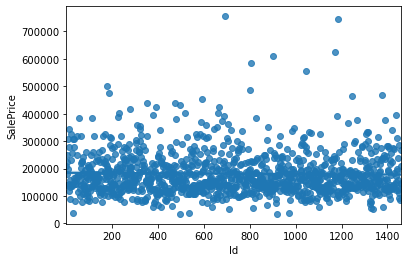

In [38]:
sns.regplot(x = 'Id',y = 'SalePrice', data = df_train)
plt.ylim()

In [39]:
df_train = df_train.drop(columns = 'Id')

(-1105.0, 791005.0)

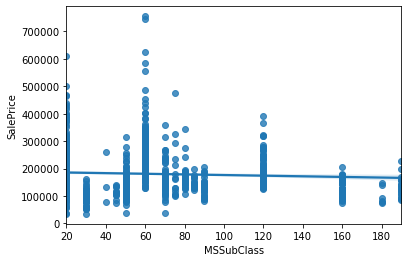

In [40]:
sns.regplot(x = 'MSSubClass',y = 'SalePrice', data = df_train)
plt.ylim()

In [41]:
df_train = df_train.drop(columns = 'MSSubClass')

(0.0, 791005.0)

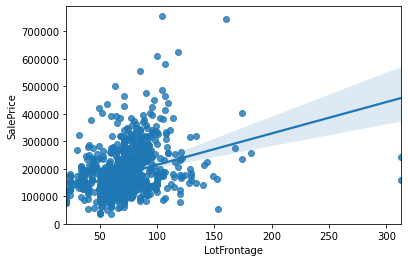

In [42]:
sns.regplot(x = 'LotFrontage',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 999523.0470423577)

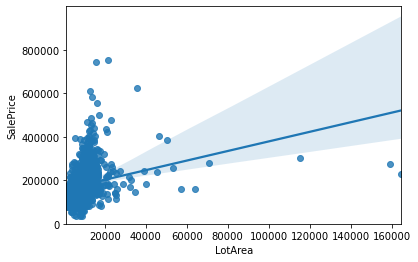

In [43]:
sns.regplot(x = 'LotArea',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 795971.2786621543)

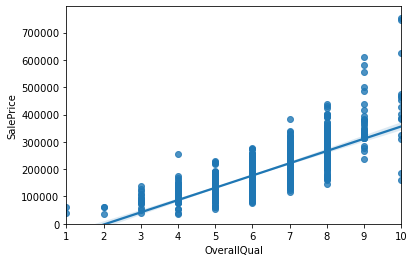

In [44]:
sns.regplot(x = 'OverallQual',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

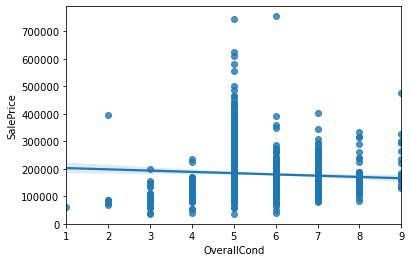

In [45]:
sns.regplot(x = 'OverallCond',y = 'SalePrice', data = df_train)
plt.ylim(0,)

In [46]:
df_train = df_train.drop(columns = 'OverallCond')

(0.0, 791005.0)

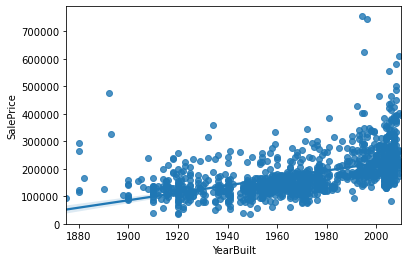

In [47]:
sns.regplot(x = 'YearBuilt',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

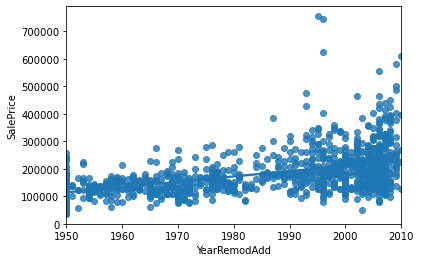

In [48]:
sns.regplot(x = 'YearRemodAdd',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

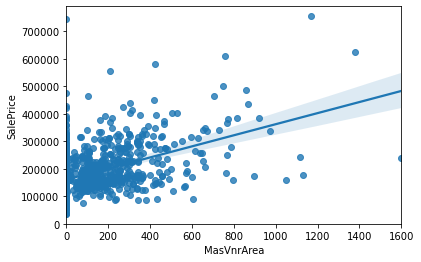

In [49]:
sns.regplot(x = 'MasVnrArea',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

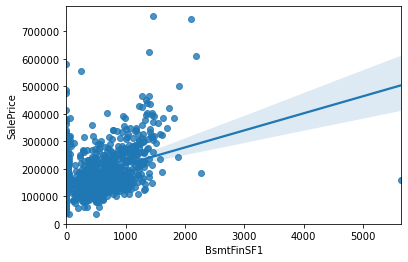

In [50]:
sns.regplot(x = 'BsmtFinSF1',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

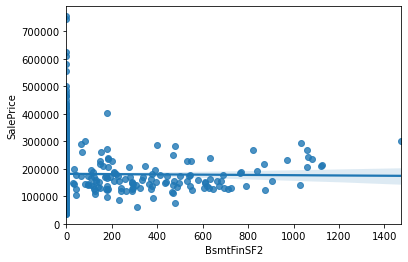

In [51]:
sns.regplot(x = 'BsmtFinSF2',y = 'SalePrice', data = df_train)
plt.ylim(0,)

In [52]:
df_train = df_train.drop(columns = 'BsmtFinSF2')

(0.0, 791005.0)

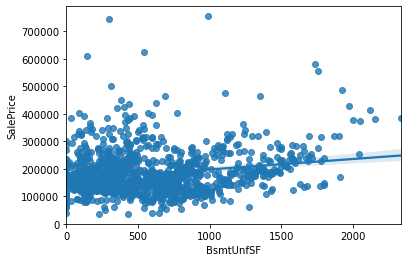

In [53]:
sns.regplot(x = 'BsmtUnfSF',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 891519.7198746386)

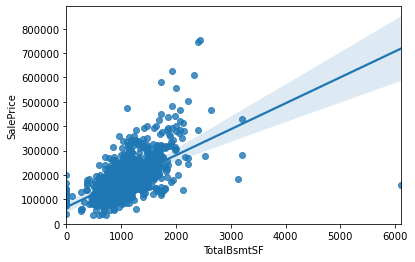

In [54]:
sns.regplot(x = 'TotalBsmtSF',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

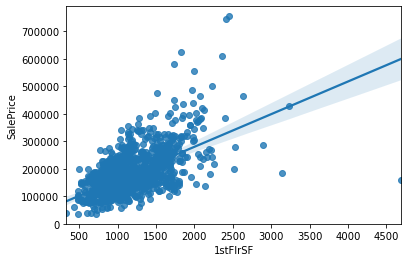

In [55]:
sns.regplot(x = '1stFlrSF',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

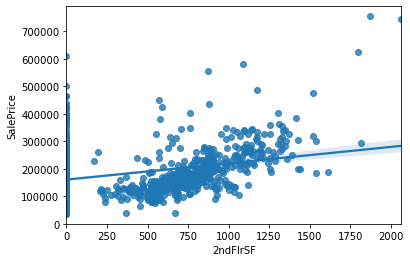

In [56]:
sns.regplot(x = '2ndFlrSF',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

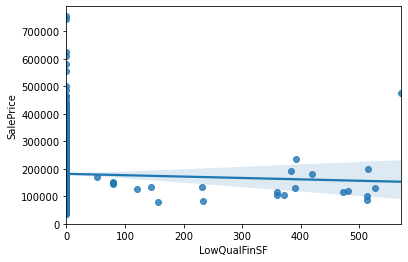

In [57]:
sns.regplot(x = 'LowQualFinSF',y = 'SalePrice', data = df_train)
plt.ylim(0,)

In [58]:
df_train = df_train.drop(columns = 'LowQualFinSF')

(0.0, 791005.0)

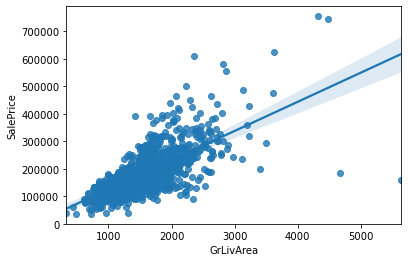

In [59]:
sns.regplot(x = 'GrLivArea',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

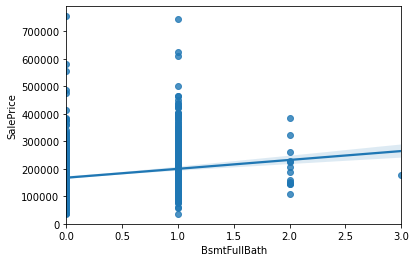

In [60]:
sns.regplot(x = 'BsmtFullBath',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

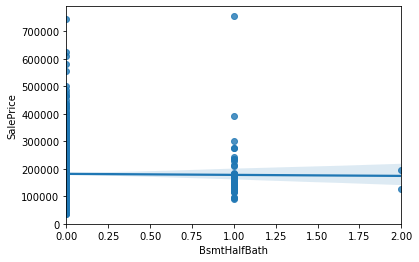

In [61]:
sns.regplot(x = 'BsmtHalfBath',y = 'SalePrice', data = df_train)
plt.ylim(0,)

In [62]:
df_train = df_train.drop(columns = 'BsmtHalfBath')

(0.0, 791005.0)

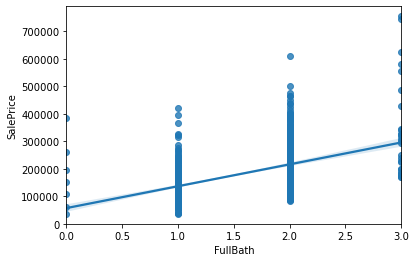

In [63]:
sns.regplot(x = 'FullBath',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

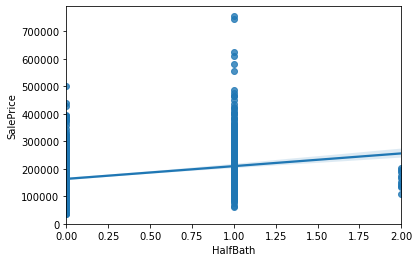

In [64]:
sns.regplot(x = 'HalfBath',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

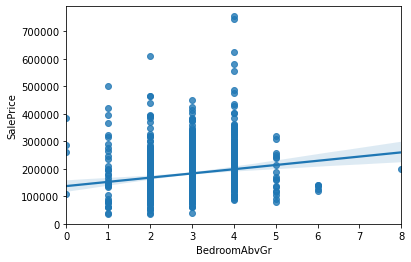

In [65]:
sns.regplot(x = 'BedroomAbvGr',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

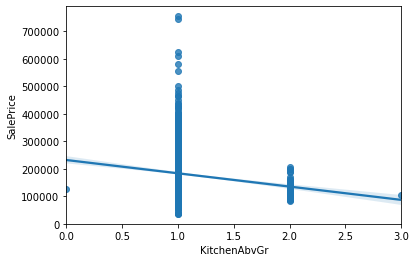

In [66]:
sns.regplot(x = 'KitchenAbvGr',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

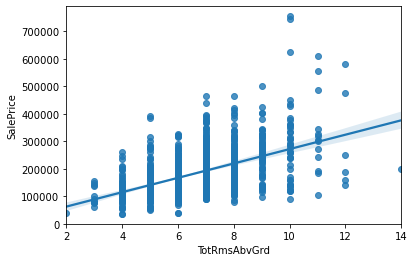

In [67]:
sns.regplot(x = 'TotRmsAbvGrd',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

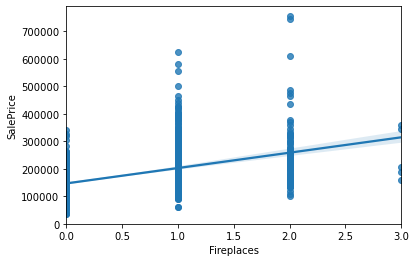

In [68]:
sns.regplot(x = 'Fireplaces',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

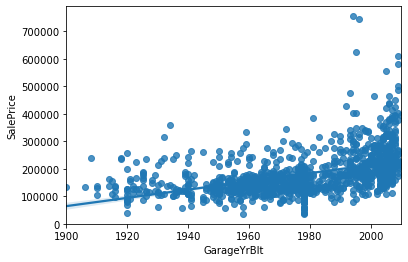

In [69]:
sns.regplot(x = 'GarageYrBlt',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

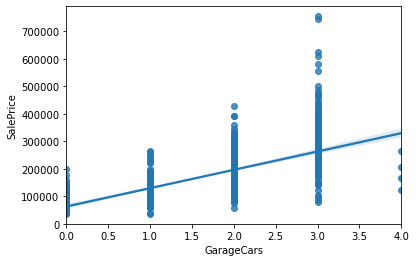

In [70]:
sns.regplot(x = 'GarageCars',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

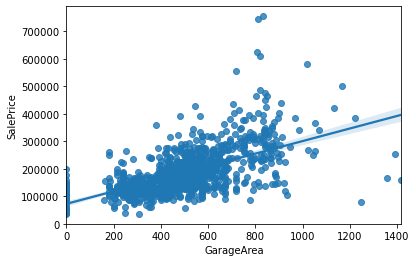

In [71]:
sns.regplot(x = 'GarageArea',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

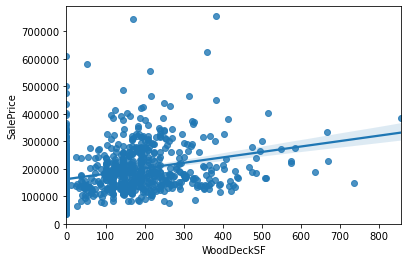

In [72]:
sns.regplot(x = 'WoodDeckSF',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

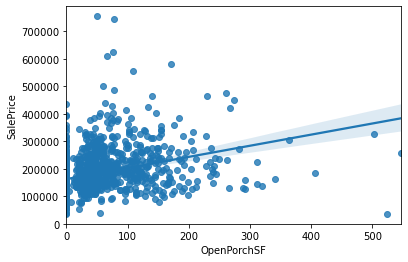

In [73]:
sns.regplot(x = 'OpenPorchSF',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

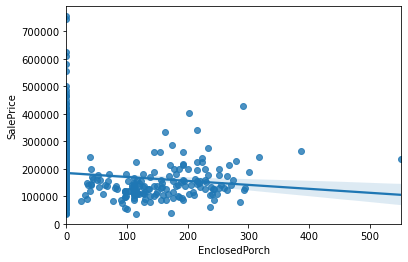

In [74]:
sns.regplot(x = 'EnclosedPorch',y = 'SalePrice', data = df_train)
plt.ylim(0,)

(0.0, 791005.0)

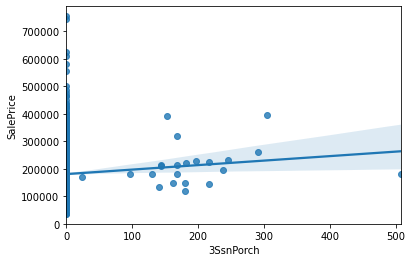

In [75]:
sns.regplot(x = '3SsnPorch',y = 'SalePrice', data = df_train)
plt.ylim(0,)

In [76]:
df_train = df_train.drop(columns = '3SsnPorch')

(0.0, 791005.0)

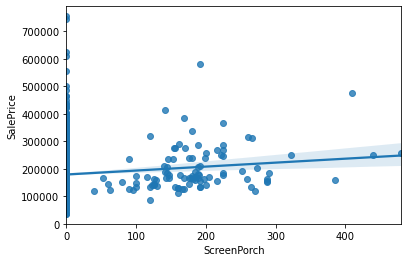

In [77]:
sns.regplot(x = 'ScreenPorch',y = 'SalePrice', data = df_train)
plt.ylim(0,)

In [78]:
df_train = df_train.drop(columns = 'ScreenPorch')

(0.0, 791005.0)

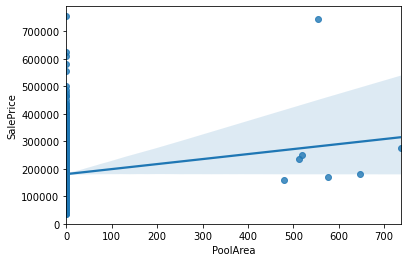

In [79]:
sns.regplot(x = 'PoolArea',y = 'SalePrice', data = df_train)
plt.ylim(0,)

In [80]:
df_train = df_train.drop(columns = 'PoolArea')

(0.0, 798928.2705430116)

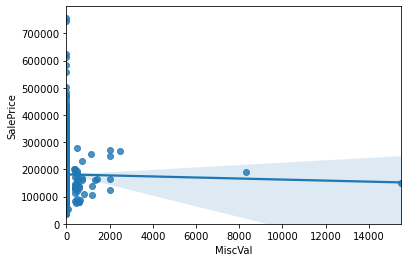

In [81]:
sns.regplot(x = 'MiscVal',y = 'SalePrice', data = df_train)
plt.ylim(0,)

In [82]:
df_train = df_train.drop(columns = 'MiscVal')

(0.0, 791005.0)

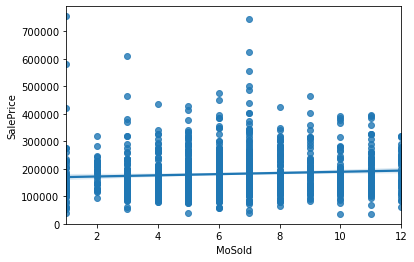

In [83]:
sns.regplot(x = 'MoSold',y = 'SalePrice', data = df_train)
plt.ylim(0,)

In [84]:
df_train = df_train.drop(columns = 'MoSold')

(0.0, 791005.0)

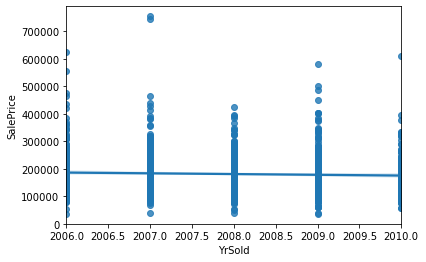

In [85]:
sns.regplot(x = 'YrSold',y = 'SalePrice', data = df_train)
plt.ylim(0,)

In [86]:
df_train = df_train.drop(columns = 'YrSold')

In [87]:
df_obj = df_train[['SaleType','PavedDrive','GarageCond','GarageQual','GarageFinish','Functional','KitchenQual','Electrical','CentralAir',
            'HeatingQC','Heating','BsmtFinType2','BsmtFinType1','BsmtExposure','BsmtCond','BsmtQual','Foundation','ExterCond','ExterQual','MasVnrType',
            'Exterior2nd','Exterior1st','RoofMatl','RoofStyle','HouseStyle','BldgType','Condition2','Condition1','Neighborhood','LandSlope','LotConfig',
            'Utilities','LandContour','LotShape','Street','MSZoning']]

In [88]:
df_obj.shape

(1168, 36)

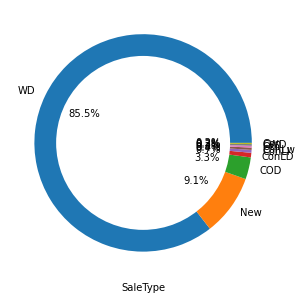

<Figure size 432x288 with 0 Axes>

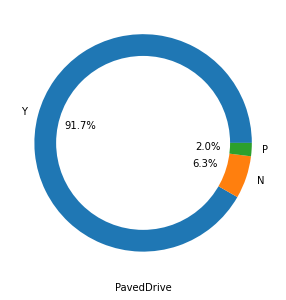

<Figure size 432x288 with 0 Axes>

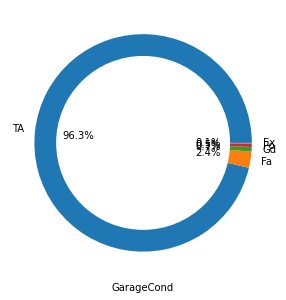

<Figure size 432x288 with 0 Axes>

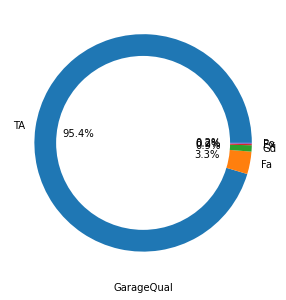

<Figure size 432x288 with 0 Axes>

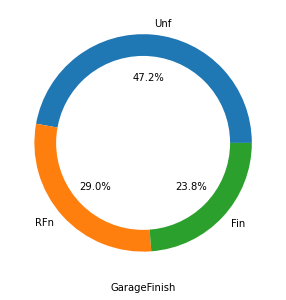

<Figure size 432x288 with 0 Axes>

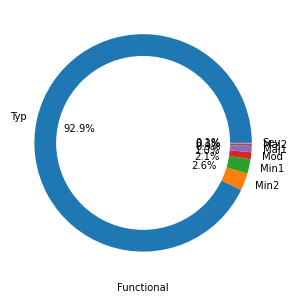

<Figure size 432x288 with 0 Axes>

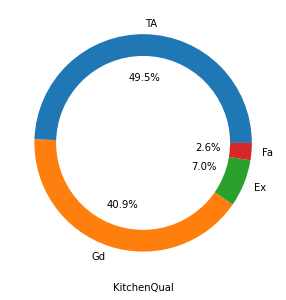

<Figure size 432x288 with 0 Axes>

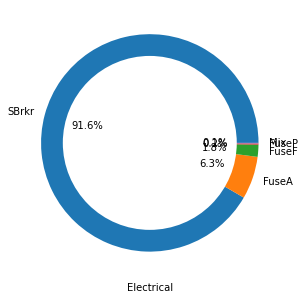

<Figure size 432x288 with 0 Axes>

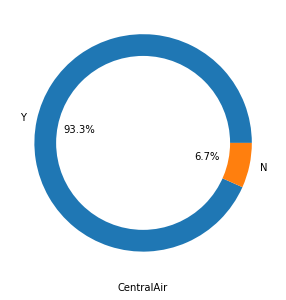

<Figure size 432x288 with 0 Axes>

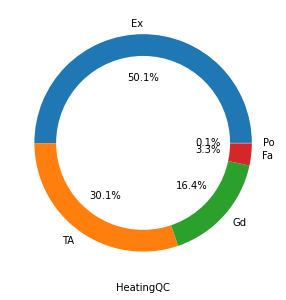

<Figure size 432x288 with 0 Axes>

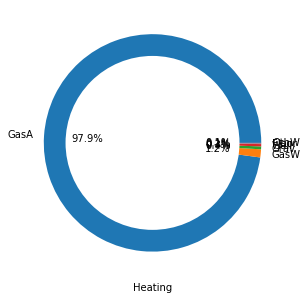

<Figure size 432x288 with 0 Axes>

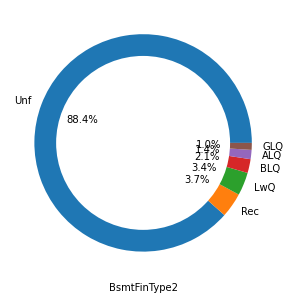

<Figure size 432x288 with 0 Axes>

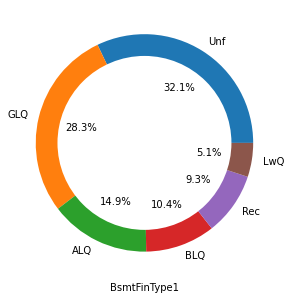

<Figure size 432x288 with 0 Axes>

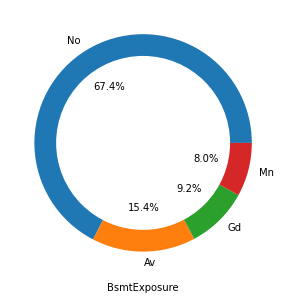

<Figure size 432x288 with 0 Axes>

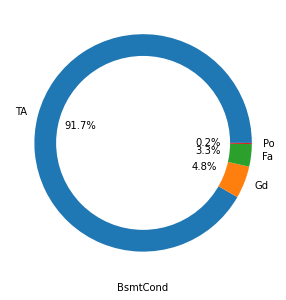

<Figure size 432x288 with 0 Axes>

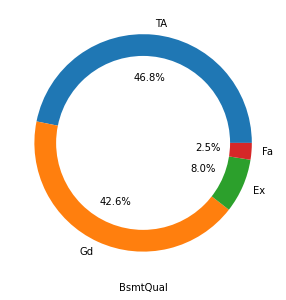

<Figure size 432x288 with 0 Axes>

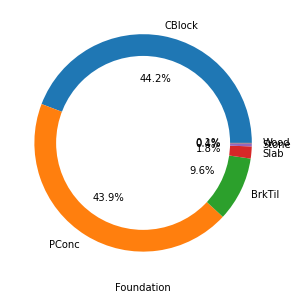

<Figure size 432x288 with 0 Axes>

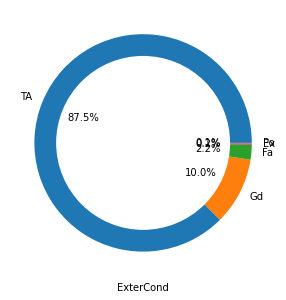

<Figure size 432x288 with 0 Axes>

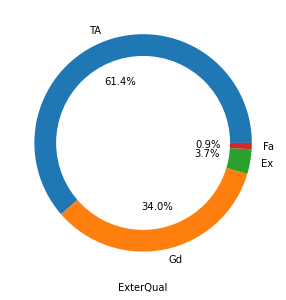

<Figure size 432x288 with 0 Axes>

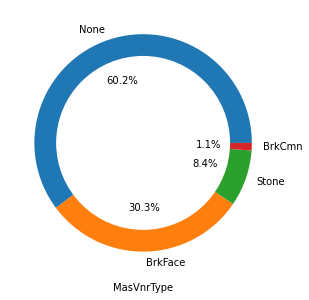

<Figure size 432x288 with 0 Axes>

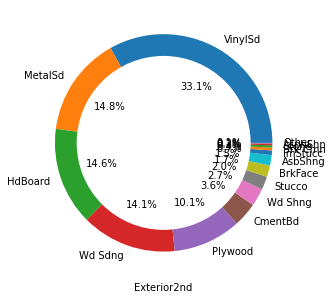

<Figure size 432x288 with 0 Axes>

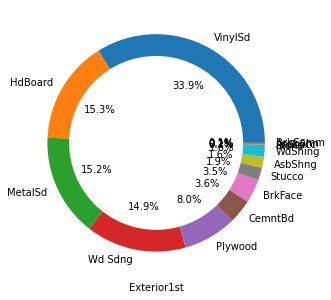

<Figure size 432x288 with 0 Axes>

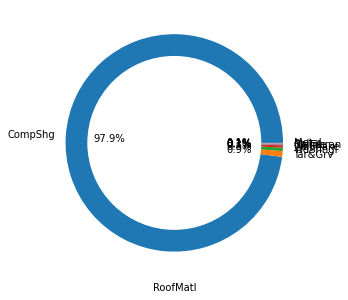

<Figure size 432x288 with 0 Axes>

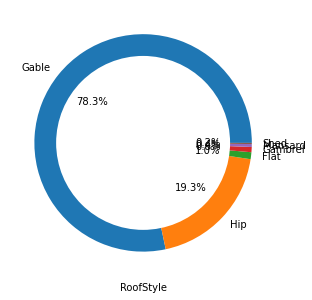

<Figure size 432x288 with 0 Axes>

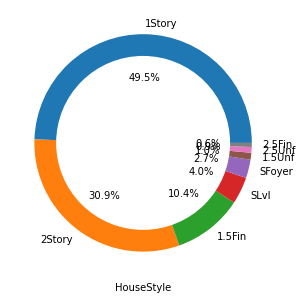

<Figure size 432x288 with 0 Axes>

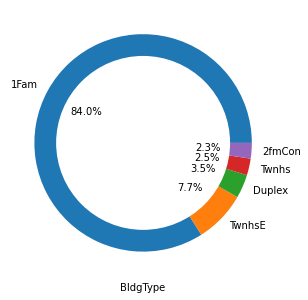

<Figure size 432x288 with 0 Axes>

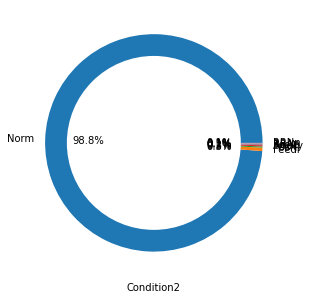

<Figure size 432x288 with 0 Axes>

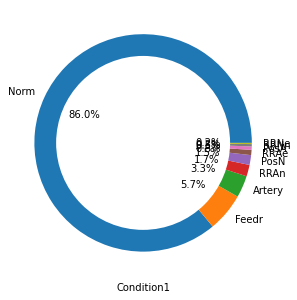

<Figure size 432x288 with 0 Axes>

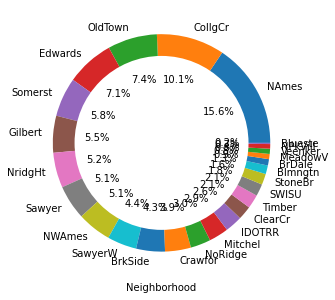

<Figure size 432x288 with 0 Axes>

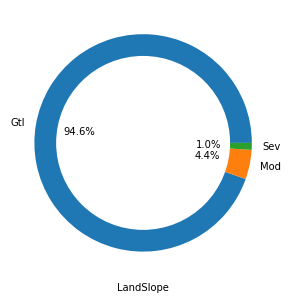

<Figure size 432x288 with 0 Axes>

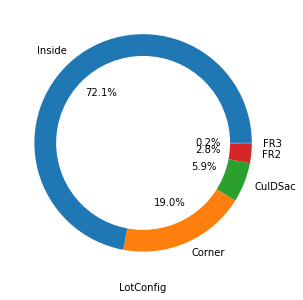

<Figure size 432x288 with 0 Axes>

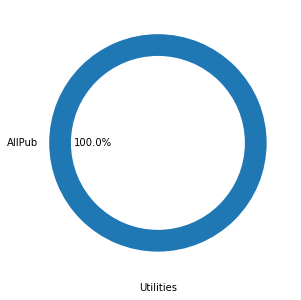

<Figure size 432x288 with 0 Axes>

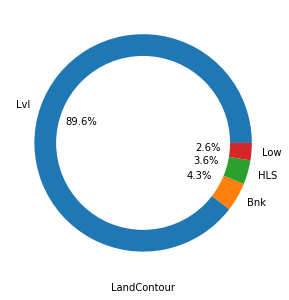

<Figure size 432x288 with 0 Axes>

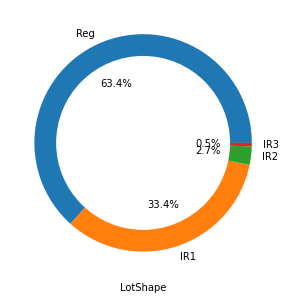

<Figure size 432x288 with 0 Axes>

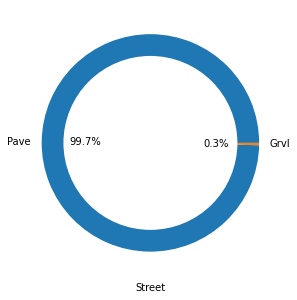

<Figure size 432x288 with 0 Axes>

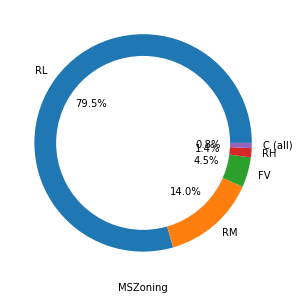

<Figure size 432x288 with 0 Axes>

In [89]:
for data in df_obj:
    plt.figure(figsize = (5,5))
    df_train[data].value_counts().plot.pie(autopct = '%1.1f%%')
    center = plt.Circle((0,0),0.8,fc = 'white')
    fig = plt.gcf()
    fig.gca().add_artist(center)
    plt.xlabel(data)
    plt.ylabel('')
    plt.figure()

In [90]:
x = df_train.drop(columns = 'SalePrice')
y = df_train['SalePrice']

In [93]:
m = df_train.drop(columns = 'SalePrice')
n = df_train['SalePrice']

In [94]:
cat=[i for i in x.columns if x[i].dtypes=='O']
encode=OrdinalEncoder()
labe=LabelEncoder()
for i in cat:
    x[i]=encode.fit_transform(x[i].values.reshape(-1,1))
    y=labe.fit_transform(y)

In [96]:
cat=[i for i in m.columns if m[i].dtypes=='O']
encode=OrdinalEncoder()
labe=LabelEncoder()
for i in cat:
    m[i]=encode.fit_transform(m[i].values.reshape(-1,1))
    n=labe.fit_transform(n)

In [97]:
#Selecting features using SelectKBest feature selection
best_features = SelectKBest(score_func = f_classif, k=40)
fit = best_features.fit(x,y)
data_scores = pd.DataFrame(fit.scores_)
data_columns = pd.DataFrame(x.columns)

feature_scores =pd.concat([data_columns , data_scores], axis = 1)
feature_scores.columns = ['feature_Name','Score']
print(feature_scores.nlargest(40,'Score'))

    feature_Name     Score
14   OverallQual  5.303071
23     ExterQual  3.514221
40     GrLivArea  2.977506
26      BsmtQual  2.876879
46   KitchenQual  2.617125
54    GarageCars  2.578547
42      FullBath  2.435854
55    GarageArea  2.316328
53  GarageFinish  2.187163
15     YearBuilt  2.133300
38      1stFlrSF  2.036680
33   TotalBsmtSF  1.867714
22    MasVnrArea  1.852976
3         Street  1.835751
2        LotArea  1.826320
16  YearRemodAdd  1.813783
52   GarageYrBlt  1.725406
34       Heating  1.707885
47  TotRmsAbvGrd  1.656866
0       MSZoning  1.640044
49    Fireplaces  1.591973
36    CentralAir  1.557680
25    Foundation  1.528516
30    BsmtFinSF1  1.482500
39      2ndFlrSF  1.476305
60   OpenPorchSF  1.460290
4       LotShape  1.407526
32     BsmtUnfSF  1.401635
35     HeatingQC  1.358939
43      HalfBath  1.337597
9   Neighborhood  1.281079
59    WoodDeckSF  1.254936
28  BsmtExposure  1.214154
50   FireplaceQu  1.203591
27      BsmtCond  1.190161
18      RoofMatl  1.179426
2

In [98]:
x_new = x[['OverallQual','Electrical','BedroomAbvGr','GarageType','MasVnrType','RoofMatl','BsmtCond','FireplaceQu','BsmtExposure','WoodDeckSF',
          'Neighborhood','HalfBath','HeatingQC','BsmtUnfSF','LotShape','OpenPorchSF','2ndFlrSF','BsmtFinSF1','Foundation','CentralAir','Fireplaces',
          'MSZoning','TotRmsAbvGrd','Heating','GarageYrBlt','YearRemodAdd','LotArea','Street','MasVnrArea','TotalBsmtSF','1stFlrSF','YearBuilt',
          'GarageFinish','GarageArea','FullBath','GarageCars','KitchenQual','BsmtQual','GrLivArea','ExterQual']]

In [99]:
#Selecting features using SelectKBest feature selection
best_features = SelectKBest(score_func = f_classif, k=40)
fit = best_features.fit(m,n)
data_scores = pd.DataFrame(fit.scores_)
data_columns = pd.DataFrame(m.columns)

feature_scores =pd.concat([data_columns , data_scores], axis = 1)
feature_scores.columns = ['feature_Name','Score']
print(feature_scores.nlargest(40,'Score'))

    feature_Name     Score
14   OverallQual  5.303071
23     ExterQual  3.514221
40     GrLivArea  2.977506
26      BsmtQual  2.876879
46   KitchenQual  2.617125
54    GarageCars  2.578547
42      FullBath  2.435854
55    GarageArea  2.316328
53  GarageFinish  2.187163
15     YearBuilt  2.133300
38      1stFlrSF  2.036680
33   TotalBsmtSF  1.867714
22    MasVnrArea  1.852976
3         Street  1.835751
2        LotArea  1.826320
16  YearRemodAdd  1.813783
52   GarageYrBlt  1.725406
34       Heating  1.707885
47  TotRmsAbvGrd  1.656866
0       MSZoning  1.640044
49    Fireplaces  1.591973
36    CentralAir  1.557680
25    Foundation  1.528516
30    BsmtFinSF1  1.482500
39      2ndFlrSF  1.476305
60   OpenPorchSF  1.460290
4       LotShape  1.407526
32     BsmtUnfSF  1.401635
35     HeatingQC  1.358939
43      HalfBath  1.337597
9   Neighborhood  1.281079
59    WoodDeckSF  1.254936
28  BsmtExposure  1.214154
50   FireplaceQu  1.203591
27      BsmtCond  1.190161
18      RoofMatl  1.179426
2

In [100]:
m_new = m[['OverallQual','Electrical','BedroomAbvGr','GarageType','MasVnrType','RoofMatl','BsmtCond','FireplaceQu','BsmtExposure','WoodDeckSF',
          'Neighborhood','HalfBath','HeatingQC','BsmtUnfSF','LotShape','OpenPorchSF','2ndFlrSF','BsmtFinSF1','Foundation','CentralAir','Fireplaces',
          'MSZoning','TotRmsAbvGrd','Heating','GarageYrBlt','YearRemodAdd','LotArea','Street','MasVnrArea','TotalBsmtSF','1stFlrSF','YearBuilt',
          'GarageFinish','GarageArea','FullBath','GarageCars','KitchenQual','BsmtQual','GrLivArea','ExterQual']]

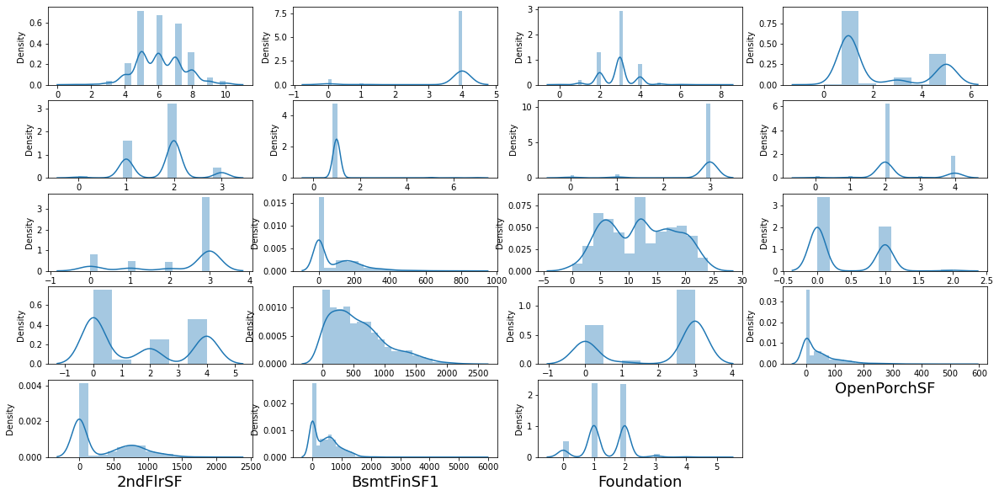

In [101]:
## plotting scatterplot to check the data distribution in the data set
plt.figure(figsize = (20,20))
plt_num =1

for column in x_new:
    if plt_num<=19:
        sx = plt.subplot(10,4,plt_num)
        sns.distplot(x_new[column])
        plt.xlabel(column,fontsize = 18)
    plt_num+=1
plt.show()

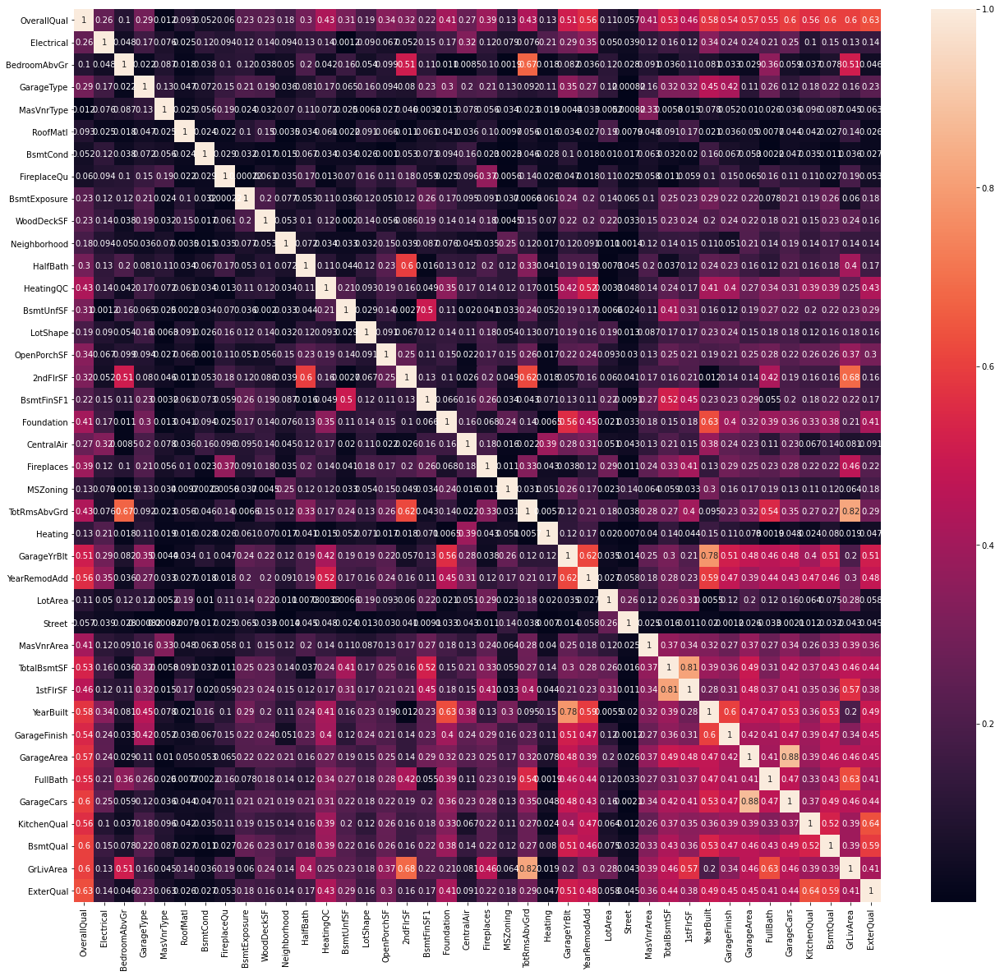

In [102]:
x_new_corr = x_new.corr().abs()
plt.figure(figsize = (22,20))
sns.heatmap(x_new_corr,annot = True,annot_kws = {'size':10})
plt.show()

In [103]:
## Transforming the dataset in standard scaler form
sc = StandardScaler()
x_sc = sc.fit_transform(x_new)

In [104]:
## Transforming the dataset in standard scaler form
sc1 = StandardScaler()
m_sc = sc.fit_transform(m_new)

In [105]:
x_new_train,x_new_test,y_train,y_test = train_test_split(x_sc,y,test_size = 0.25,random_state = 3)

In [106]:
m_new_train,m_new_test,n_train,n_test = train_test_split(m_sc,n,test_size = 0.25,random_state = 3)

In [107]:
lr = LinearRegression()

In [108]:
lr.fit(x_new_train,y_train)

LinearRegression()

In [110]:
y_pred = lr.predict(m_new_test)
y_pred

array([346.4159174 , 151.99644897, 187.14342831, 170.72931425,
       368.38006565, 105.67244159, 553.04441091, 223.90492136,
       109.79708297, 320.0476484 , 304.11855248, 285.81560158,
       119.56828295, 319.47456066, 220.0188418 , 308.98252905,
       123.15846762, 292.56917422, 341.97512433, 329.76263787,
        93.5372567 , 112.91656421, 249.42376088, 278.13201982,
       183.73557854, 474.51646322, 361.70609215,  86.38536569,
        80.94490947,  98.10728294, 217.10992229, 321.57643975,
       290.6114065 ,  54.73483911, 149.74964816, -54.12735309,
       198.14006964, 205.77935308, 408.33075758, 251.49949878,
       174.12339507, 483.6185179 , 147.80955486, 247.24095839,
       256.77437882, 358.86803824, 393.34674163, 381.41818202,
       217.24854783, 258.43228468, 303.76349192, 114.1716607 ,
       439.90125809, 157.26881517, 166.71020331, 159.14426525,
       331.16156119, 425.46479176, 284.70883224, 451.91832919,
       129.02611227, 171.24088616, 301.2355946 , 581.15

In [111]:
lr.score(m_new_test,y_pred)

1.0

In [114]:
mean_absolute_error(n_test,y_pred)

45.13307333598701

In [115]:
# Mean squared error for checking model error
mean_squared_error(n_test,y_pred)

3336.918577146835

In [116]:
np.sqrt(mean_squared_error(n_test,y_pred))

57.766067696761525

In [117]:
lacv = LassoCV(alphas = None, max_iter = 1000,normalize = True)
lacv.fit(x_new_train,y_train)

LassoCV(normalize=True)

In [119]:
#alpha
alpha = lacv.alpha_
alpha

0.07247396821879361

In [120]:
las_knn = Lasso(alpha)
las_knn.fit(x_new_train,y_train)

Lasso(alpha=0.07247396821879361)

In [121]:
las_knn.score(m_new_test,n_test)

0.8546130599535281

In [122]:
#RidgeCV score 
ridcv = RidgeCV(alphas = np.arange(0.001,0.1,0.01),normalize = True)
ridcv.fit(x_new_train,y_train)

RidgeCV(alphas=array([0.001, 0.011, 0.021, 0.031, 0.041, 0.051, 0.061, 0.071, 0.081,
       0.091]),
        normalize=True)

In [123]:
ridcv.alpha_

0.09099999999999998

In [124]:
rd = Ridge(alpha = ridcv.alpha_)
rd.fit(x_new_train,y_train)

Ridge(alpha=0.09099999999999998)

In [127]:
rd.score(m_new_test,n_test)

0.8547398334283083

In [131]:
kn = KNeighborsRegressor()
kn.fit(x_new_train,y_train)

KNeighborsRegressor()

In [132]:
y_pred = kn.predict(m_new_test)
y_pred

array([311.8, 136.4, 116.4, 147.6, 374. , 151.4, 457. , 284.8,  93.4,
       255.6, 258.6, 217.8, 146.4, 308. , 156. , 296.6, 155.2, 228.8,
       266.8, 326.4,  99.6,  78.4, 189. , 310.4, 105.2, 526.2, 335. ,
       117.2,  65.6, 127.6, 216.8, 404.8, 272.6, 106. ,  87.8,  52.4,
       169.2, 215.2, 393. , 170. , 111.6, 400.6, 125.4, 218.4, 206.6,
       345.2, 385.4, 322. , 208. , 177.2, 264.6, 123.4, 330.4, 139.2,
       169.6, 160.2, 286.8, 353.6, 369.4, 418.8,  59.2, 149.6, 262.4,
       463. , 251.6, 212.4, 409.8, 168.8, 517.6, 125.4, 495.4, 234.2,
       341.2,  64.2, 523.6, 111.8, 477.4, 178.4,  76.6, 319. , 175.2,
       361.8, 302.4, 333.6,  94.6, 467. , 311.2, 127.4, 151.6, 436.2,
       203.2, 331.6, 412. , 212. , 295. , 249.4,  90.6,  49.6, 354.6,
        86. , 258.4, 377.4, 402.2, 529.8, 144.2, 401.2, 254. , 543.2,
       205.4, 161.2, 417.6, 149. , 533.6, 210.4, 174.2, 350.4, 224.2,
        98.8, 370.2, 149.6, 387.8,  38.4, 401.4, 338.8, 133.2, 192. ,
       224.6, 352.6,

In [133]:
kn.score(m_new_test,y_pred)

1.0

In [134]:
mean_absolute_error(n_test,y_pred)

44.87465753424658

In [135]:
# Mean squared error for checking model error
mean_squared_error(n_test,y_pred)

3905.677397260274

In [136]:
np.sqrt(mean_squared_error(n_test,y_pred))

62.495419010198454

In [137]:
lacv = LassoCV(alphas = None, max_iter = 1000,normalize = True)
lacv.fit(x_new_train,y_train)

LassoCV(normalize=True)

In [138]:
#alpha
alpha = lacv.alpha_
alpha

0.07247396821879361

In [139]:
las_knn = Lasso(alpha)
las_knn.fit(x_new_train,y_train)

Lasso(alpha=0.07247396821879361)

In [140]:
las_knn = Lasso(alpha)
las_knn.fit(x_new_train,y_train)

Lasso(alpha=0.07247396821879361)

In [141]:
las_knn.score(m_new_test,n_test)

0.8546130599535281

In [142]:
#RidgeCV score 
ridcv = RidgeCV(alphas = np.arange(0.001,0.1,0.01),normalize = True)
ridcv.fit(x_new_train,y_train)

RidgeCV(alphas=array([0.001, 0.011, 0.021, 0.031, 0.041, 0.051, 0.061, 0.071, 0.081,
       0.091]),
        normalize=True)

In [143]:
ridcv.alpha_

0.09099999999999998

In [146]:
rd.score(m_new_test,n_test)

0.8547398334283083